# Signal Processing Pipeline for Neural Data

Prototyping the processing pipeline before implementing the real-time backend.

In [62]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter
from scipy.signal import butter, iirnotch, sosfilt, welch

%matplotlib inline
plt.style.use("dark_background")

## 1. Load Data

In [63]:
# SELECT DIFFICULTY LEVEL
DIFFICULTY = "super_easy"  # Options: "super_easy", "easy", "medium", "hard"
MAX_SECONDS = 30  # Limit data to avoid OOM and animation size issues

# Processing settings per difficulty
PROCESSING_SETTINGS = {
    "super_easy": {
        "notch_60hz": False,  # No line noise
        "bandpass": True,  # Still need to extract high-gamma
        "bad_channel_detection": False,  # No dead/artifact channels
        "spatial_sigma": 0.0,  # No spatial smoothing
        "ema_alpha": 0.3,  # Fast response, clean signal
    },
    "easy": {
        "notch_60hz": False,
        "bandpass": True,
        "bad_channel_detection": False,
        "spatial_sigma": 0.5,
        "ema_alpha": 0.2,
    },
    "medium": {
        "notch_60hz": True,  # Has 60Hz noise
        "bandpass": True,
        "bad_channel_detection": True,  # Has some bad channels
        "spatial_sigma": 1.0,
        "ema_alpha": 0.15,
    },
    "hard": {
        "notch_60hz": True,  # 60Hz line noise
        "bandpass": True,
        "bad_channel_detection": True,  # Dead + artifact channels
        "spatial_sigma": 1.5,  # Spatial smoothing restored
        "ema_alpha": 0.1,  # Slower, smoother response
    },
}

SETTINGS = PROCESSING_SETTINGS[DIFFICULTY]
print(f"Difficulty: {DIFFICULTY}")
print(f"Settings: {SETTINGS}")

DATA_DIR = Path(f"../data/{DIFFICULTY}")
print(f"\nLoading {DIFFICULTY} dataset (first {MAX_SECONDS}s)...")

# Load neural data - limit to MAX_SECONDS
data = pd.read_parquet(DATA_DIR / "track2_data.parquet")
max_samples = int(MAX_SECONDS * 500)
data = data.iloc[:max_samples]
print(f"Neural data shape: {data.shape}")
print(f"Time range: {data.index.min():.2f}s to {data.index.max():.2f}s")
print(f"Sampling rate: {1 / (data.index[1] - data.index[0]):.0f} Hz")

# Load ground truth - limit to MAX_SECONDS
gt = pd.read_parquet(DATA_DIR / "ground_truth.parquet")
gt = gt[gt['time_s'] <= MAX_SECONDS]
print(f"\nGround truth columns: {list(gt.columns)}")

Difficulty: super_easy
Settings: {'notch_60hz': False, 'bandpass': True, 'bad_channel_detection': False, 'spatial_sigma': 0.0, 'ema_alpha': 0.3}

Loading super_easy dataset (first 30s)...
Neural data shape: (15000, 1024)
Time range: 0.00s to 30.00s
Sampling rate: 500 Hz

Ground truth columns: ['time_s', 'vx', 'vy', 'click', 'phase', 'vx_pos_center_row', 'vx_pos_center_col', 'vx_neg_center_row', 'vx_neg_center_col', 'vy_pos_center_row', 'vy_pos_center_col', 'vy_neg_center_row', 'vy_neg_center_col', 'click_center_row', 'click_center_col']


In [64]:
# Convert to numpy for processing
neural_data = data.values.astype(np.float32)  # float32 saves memory
time_s = data.index.values
fs = 500  # Hz
del data  # Free DataFrame memory

print(f"Neural data: {neural_data.shape}")
print(f"dtype: {neural_data.dtype}")

Neural data: (15000, 1024)
dtype: float32


## 2. Visualize Raw Signals

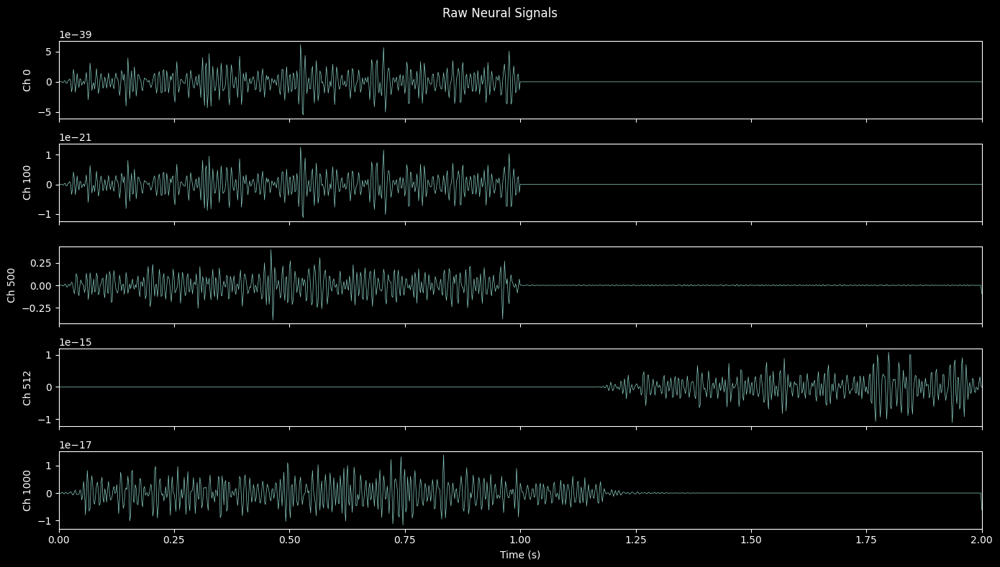

In [65]:
# Pick a few channels to visualize
channels_to_plot = [0, 100, 500, 512, 1000]
time_window = (0, 2)  # seconds

mask = (time_s >= time_window[0]) & (time_s <= time_window[1])

fig, axes = plt.subplots(len(channels_to_plot), 1, figsize=(14, 8), sharex=True)
for i, ch in enumerate(channels_to_plot):
    axes[i].plot(time_s[mask], neural_data[mask, ch], linewidth=0.5)
    axes[i].set_ylabel(f"Ch {ch}")
    axes[i].set_xlim(time_window)
axes[-1].set_xlabel("Time (s)")
plt.suptitle("Raw Neural Signals")
plt.tight_layout()

(0.0, 200.0)

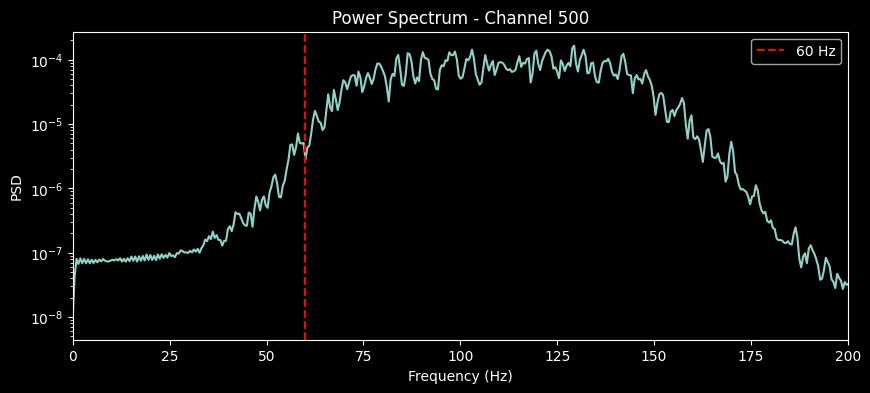

In [66]:
# Check for 60 Hz line noise - power spectrum of a single channel
ch = 500
f, psd = welch(neural_data[:, ch], fs=fs, nperseg=1024)

plt.figure(figsize=(10, 4))
plt.semilogy(f, psd)
plt.axvline(60, color="r", linestyle="--", label="60 Hz")
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD")
plt.title(f"Power Spectrum - Channel {ch}")
plt.legend()
plt.xlim(0, 200)

## 3. Bad Channel Detection

In [67]:
class BadChannelDetector:
    def __init__(self, dead_thresh=1e-8, artifact_mult=50):
        self.dead_thresh = dead_thresh
        self.artifact_mult = artifact_mult

    def detect(self, data_buffer):
        """Detect bad channels from data buffer.

        Args:
            data_buffer: (n_samples, n_channels) array

        Returns:
            bad_mask: boolean array of shape (n_channels,)
        """
        variance = np.var(data_buffer, axis=0)
        median_var = np.median(variance)

        # Dead channels: near-zero variance
        dead = variance < self.dead_thresh

        # Artifact channels: way too much variance
        artifact = variance > median_var * self.artifact_mult

        # Saturated: stuck at constant value (range near zero)
        ranges = np.ptp(data_buffer, axis=0)
        saturated = ranges < self.dead_thresh

        bad_mask = dead | artifact | saturated

        return bad_mask, {
            "dead": np.where(dead)[0],
            "artifact": np.where(artifact)[0],
            "saturated": np.where(saturated)[0],
            "variance": variance,
        }

In [68]:
# Detect bad channels using first 2 seconds of data
if SETTINGS["bad_channel_detection"]:
    detector = BadChannelDetector()
    init_samples = int(2 * fs)  # 2 seconds
    bad_mask, info = detector.detect(neural_data[:init_samples])

    print(f"Total bad channels: {bad_mask.sum()}")
    print(f"Dead channels: {info['dead']}")
    print(f"Artifact channels: {info['artifact']}")
    print(f"Saturated channels: {info['saturated']}")
else:
    bad_mask = np.zeros(1024, dtype=bool)
    info = {
        "dead": [],
        "artifact": [],
        "saturated": [],
        "variance": np.var(neural_data[:1000], axis=0),
    }
    print("Bad channel detection DISABLED for this difficulty")

Bad channel detection DISABLED for this difficulty


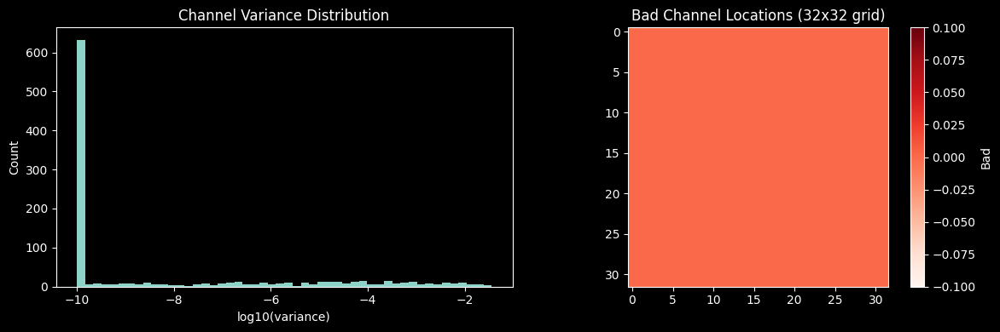

In [69]:
# Visualize variance distribution
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(np.log10(info["variance"] + 1e-10), bins=50)
plt.xlabel("log10(variance)")
plt.ylabel("Count")
plt.title("Channel Variance Distribution")

plt.subplot(1, 2, 2)
bad_grid = bad_mask.reshape(32, 32)
plt.imshow(bad_grid, cmap="Reds")
plt.colorbar(label="Bad")
plt.title("Bad Channel Locations (32x32 grid)")
plt.tight_layout()

## 4. Notch Filter (60 Hz)

In [70]:
def create_notch_filter(freq=60, Q=30, fs=500):
    """Create 60 Hz notch filter."""
    b, a = iirnotch(freq, Q, fs)
    # Convert to SOS for numerical stability
    from scipy.signal import tf2sos

    sos = tf2sos(b, a)
    return sos


notch_sos = create_notch_filter(60, Q=30, fs=fs)

In [71]:
# Apply notch filter (conditional)
if SETTINGS["notch_60hz"]:
    notched = sosfilt(notch_sos, neural_data, axis=0)
    print("Applied 60 Hz notch filter")

    # Compare spectra before/after
    ch = 500
    f_raw, psd_raw = welch(neural_data[:, ch], fs=fs, nperseg=1024)
    f_notch, psd_notch = welch(notched[:, ch], fs=fs, nperseg=1024)

    plt.figure(figsize=(10, 4))
    plt.semilogy(f_raw, psd_raw, label="Raw", alpha=0.7)
    plt.semilogy(f_notch, psd_notch, label="After notch", alpha=0.7)
    plt.axvline(60, color="r", linestyle="--", alpha=0.5)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("PSD")
    plt.title(f"60 Hz Notch Filter Effect - Channel {ch}")
    plt.legend()
    plt.xlim(0, 200)
else:
    notched = neural_data  # Pass through
    print("Notch filter DISABLED - no 60 Hz noise in this difficulty")

Notch filter DISABLED - no 60 Hz noise in this difficulty


## 5. Bandpass Filter (70-150 Hz High Gamma)

In [72]:
def create_bandpass_filter(lowcut=70, highcut=150, fs=500, order=4):
    """Create bandpass filter for high gamma band."""
    sos = butter(order, [lowcut, highcut], btype="band", fs=fs, output="sos")
    return sos


bp_sos = create_bandpass_filter(70, 150, fs=fs, order=4)

(0.0, 200.0)

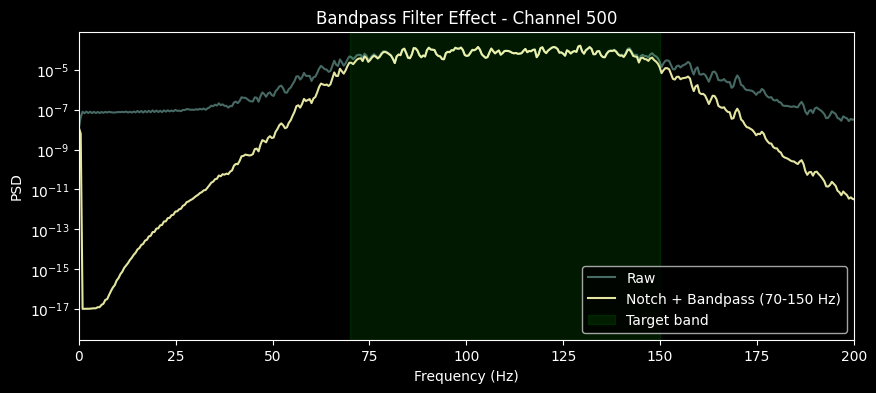

In [73]:
# Apply bandpass after notch
filtered = sosfilt(bp_sos, notched, axis=0)

# Compare spectra
ch = 500
f_raw, psd_raw = welch(neural_data[:, ch], fs=fs, nperseg=1024)
f_filt, psd_filt = welch(filtered[:, ch], fs=fs, nperseg=1024)

plt.figure(figsize=(10, 4))
plt.semilogy(f_raw, psd_raw, label="Raw", alpha=0.5)
plt.semilogy(f_filt, psd_filt, label="Notch + Bandpass (70-150 Hz)", alpha=0.9)
plt.axvspan(70, 150, alpha=0.2, color="green", label="Target band")
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD")
plt.title(f"Bandpass Filter Effect - Channel {ch}")
plt.legend()
plt.xlim(0, 200)

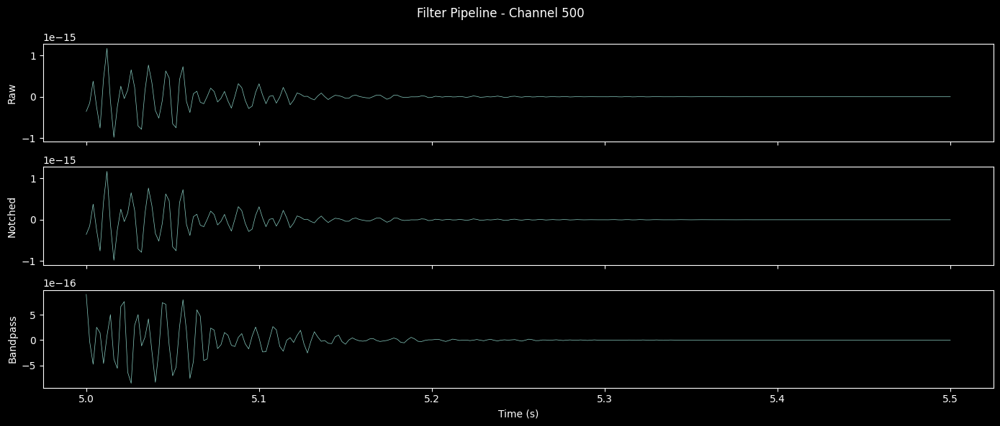

In [74]:
# Time domain comparison
time_window = (5, 5.5)  # 500ms window
mask = (time_s >= time_window[0]) & (time_s <= time_window[1])

fig, axes = plt.subplots(3, 1, figsize=(14, 6), sharex=True)
axes[0].plot(time_s[mask], neural_data[mask, ch], linewidth=0.5)
axes[0].set_ylabel("Raw")
axes[1].plot(time_s[mask], notched[mask, ch], linewidth=0.5)
axes[1].set_ylabel("Notched")
axes[2].plot(time_s[mask], filtered[mask, ch], linewidth=0.5)
axes[2].set_ylabel("Bandpass")
axes[2].set_xlabel("Time (s)")
plt.suptitle(f"Filter Pipeline - Channel {ch}")
plt.tight_layout()

## 6. Power Envelope Extraction

In [75]:
def compute_power(filtered_data, window_ms=100, fs=500):
    """Compute smoothed power envelope for multi-channel data."""
    n_samples, n_channels = filtered_data.shape
    window_samples = int(window_ms * fs / 1000)
    kernel = np.ones(window_samples) / window_samples

    smoothed = np.zeros_like(filtered_data)

    for ch in range(n_channels):
        power = filtered_data[:, ch] ** 2
        smoothed[:, ch] = np.convolve(power, kernel, mode="same")

    return smoothed


power_highgamma = compute_power(filtered)
print(f"Power shape: {power_highgamma.shape}")

Power shape: (15000, 1024)


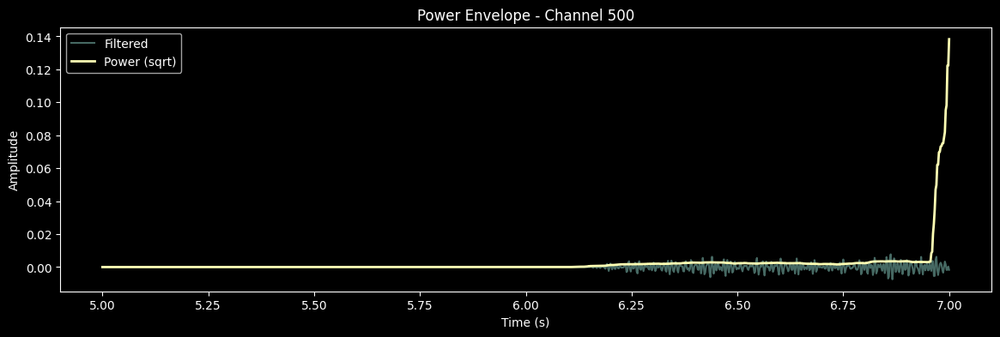

In [76]:
# Visualize power
time_window = (5, 7)  # 2 second window
mask = (time_s >= time_window[0]) & (time_s <= time_window[1])

ch = 500
plt.figure(figsize=(14, 4))
plt.plot(time_s[mask], filtered[mask, ch], alpha=0.5, label="Filtered")
plt.plot(
    time_s[mask], np.sqrt(power_highgamma[mask, ch]), label="Power (sqrt)", linewidth=2
)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Power Envelope - Channel {ch}")
plt.legend()

In [77]:
# Apply temporal EMA smoothing
def compute_smoothed_power_over_time(power_data, alpha=0.1):
    """Apply EMA smoothing across time for all channels."""
    n_samples, n_channels = power_data.shape
    smoothed = np.zeros_like(power_data)
    state = power_data[0].copy()

    for t in range(n_samples):
        state = alpha * power_data[t] + (1 - alpha) * state
        smoothed[t] = state

    return smoothed


power_smoothed = compute_smoothed_power_over_time(
    power_highgamma, alpha=SETTINGS["ema_alpha"]
)
print(f"Smoothed power shape: {power_smoothed.shape}")
print(f"EMA alpha: {SETTINGS['ema_alpha']}")

Smoothed power shape: (15000, 1024)
EMA alpha: 0.3


## 7. Visualize 32x32 Grid Over Time

In [78]:
def to_grid(power_1024, bad_mask=None, sigma=0.0):
    """Convert 1024 channel values to 32x32 grid with optional smoothing."""
    grid = power_1024.reshape(32, 32)

    if bad_mask is not None:
        bad_grid = bad_mask.reshape(32, 32)
        grid[bad_grid] = 0

    if sigma > 0:
        grid = gaussian_filter(grid, sigma=sigma)

    return grid

In [79]:
# Create grids for visualization (sample every 50 frames = 100ms)
step = 50
grid_indices = range(0, len(power_smoothed), step)
grids = np.array(
    [
        to_grid(power_smoothed[i], bad_mask, sigma=SETTINGS["spatial_sigma"])
        for i in grid_indices
    ]
)
time_ds = time_s[::step][: len(grids)]
print(f"Grids shape: {grids.shape}")
print(f"Spatial sigma: {SETTINGS['spatial_sigma']}")

Grids shape: (300, 32, 32)
Spatial sigma: 0.0


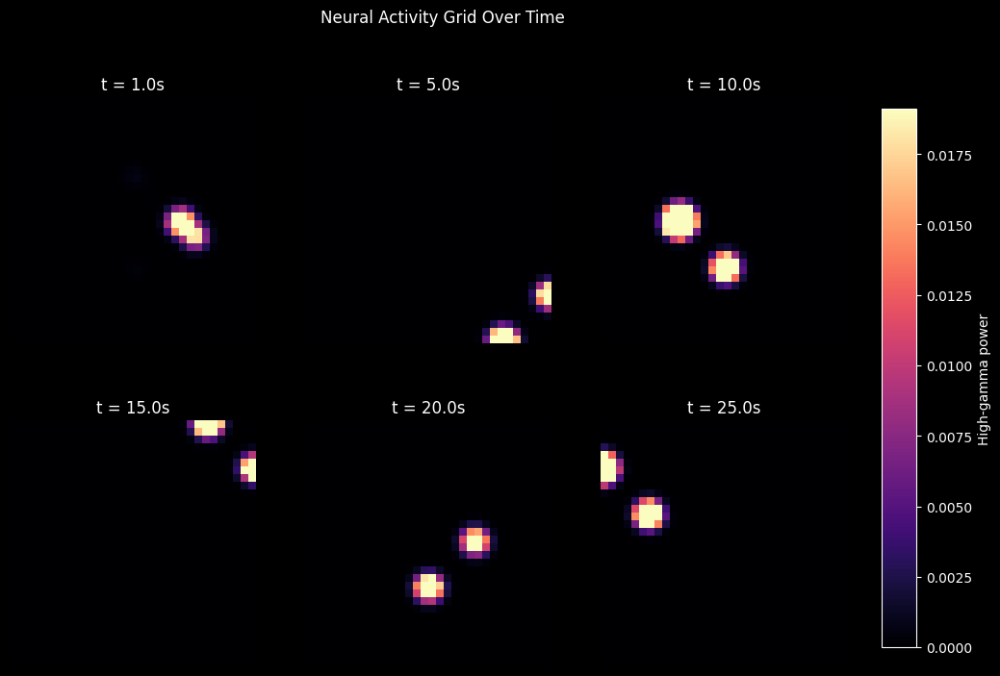

In [80]:
# Plot a few snapshots
times_to_show = [1, 5, 10, 15, 20, 25]  # seconds

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
vmax = np.percentile(grids, 99)

for ax, t in zip(axes.flat, times_to_show):
    idx = np.argmin(np.abs(time_ds - t))
    im = ax.imshow(grids[idx], cmap="magma", vmin=0, vmax=vmax)
    ax.set_title(f"t = {time_ds[idx]:.1f}s")
    ax.axis("off")

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.88, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax, label="High-gamma power")
plt.suptitle("Neural Activity Grid Over Time")
plt.show()

Built accumulator over 300 frames
Decay=0.7, Weight=0.1
Using weighted centroid (no KMeans)


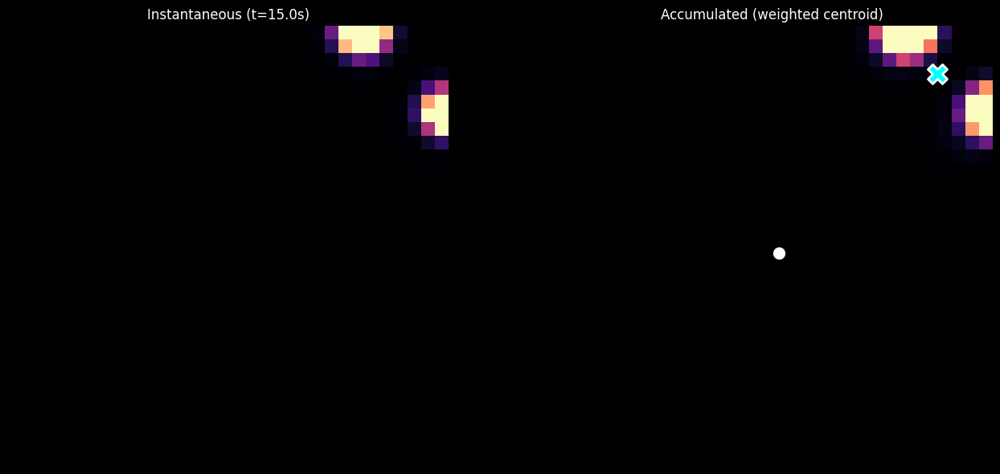

Tracked center: (3.0, 27.5)


In [81]:
# Cluster detection with ACCUMULATOR - weighted centroid tracking
# No KMeans - just center of mass weighted by intensity


def weighted_centroid(grid, threshold_percentile=50):
    """Find center of mass weighted by intensity."""
    # Zero out low values to focus on hotspots
    threshold = np.percentile(grid, threshold_percentile)
    masked = np.where(grid > threshold, grid, 0)

    total = masked.sum()
    if total < 1e-10:
        return np.array([16.0, 16.0])  # Default to center

    rows, cols = np.mgrid[0:32, 0:32]
    center_row = (rows * masked).sum() / total
    center_col = (cols * masked).sum() / total
    return np.array([center_row, center_col])


# Build accumulated activity map over time
DECAY = 0.7  # Faster response
ACCUMULATE_WEIGHT = 0.1  # Lower weight to new activity

accumulated = np.zeros((32, 32))
accumulated_grids = []
centers_over_time = []

for i, grid in enumerate(grids):
    # Normalize current frame to 0-1
    grid_norm = grid / (np.percentile(grid, 99) + 1e-10)
    grid_norm = np.clip(grid_norm, 0, 1)

    # Accumulate: decay old + add new
    accumulated = DECAY * accumulated + ACCUMULATE_WEIGHT * grid_norm
    accumulated_grids.append(accumulated.copy())

    # Find weighted centroid on accumulated map
    center = weighted_centroid(accumulated, threshold_percentile=50)
    centers_over_time.append(center)

accumulated_grids = np.array(accumulated_grids)
print(f"Built accumulator over {len(grids)} frames")
print(f"Decay={DECAY}, Weight={ACCUMULATE_WEIGHT}")
print("Using weighted centroid (no KMeans)")

# Show comparison: instantaneous vs accumulated
test_frame = 150
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Left: instantaneous
vmax = np.percentile(grids, 99)
axes[0].imshow(grids[test_frame], cmap="magma", vmin=0, vmax=vmax)
axes[0].set_title(f"Instantaneous (t={time_ds[test_frame]:.1f}s)")
axes[0].axis("off")

# Right: accumulated with center
acc_vmax = np.percentile(accumulated_grids, 99)
axes[1].imshow(accumulated_grids[test_frame], cmap="magma", vmin=0, vmax=acc_vmax)
center = centers_over_time[test_frame]
if center is not None:
    axes[1].scatter(
        center[1],
        center[0],
        c="cyan",
        s=300,
        marker="X",
        edgecolors="white",
        linewidths=2,
    )
    axes[1].scatter(16, 16, c="white", s=100, marker="o")
axes[1].set_title("Accumulated (weighted centroid)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

print(f"Tracked center: ({center[0]:.1f}, {center[1]:.1f})")

In [90]:
# Animated replay comparing DRIFT TRACKING ALGORITHMS vs Ground Truth
# FIXED: Algorithms now LOCK ONTO discovered nodes rather than tracking current activity
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from scipy.ndimage import label, maximum_filter
from scipy.signal import correlate2d
from collections import deque

print("Running improved drift tracking algorithms...")
print("Key insight: LOCK onto nodes when discovered, track their drift even when dark")
print("=" * 70)

# -----------------------------------------------------------------------------
# Algorithm 1: LOCKED NODE TRACKER
# When a peak persists for N frames, LOCK its position permanently
# Track centroid of ALL locked nodes (even when inactive)
# -----------------------------------------------------------------------------
def algo1_locked_nodes(grids, lock_threshold=5, activation_pct=85, min_dist=4):
    """Lock onto nodes when they persist, track their constellation."""
    locked_nodes = []  # List of (row, col) - permanent once locked
    candidate_nodes = []  # List of (row, col, frames_seen)
    centers = []
    
    for frame_idx, grid in enumerate(grids):
        # Find current peaks
        local_max = maximum_filter(grid, size=3) == grid
        threshold = np.percentile(grid, activation_pct)
        peaks_mask = local_max & (grid > threshold)
        current_peaks = np.argwhere(peaks_mask)
        
        # Update candidates - match to existing or create new
        new_candidates = []
        matched_current = set()
        
        for cr, cc, frames in candidate_nodes:
            # Find closest current peak
            best_dist = min_dist + 1
            best_idx = None
            for idx, (pr, pc) in enumerate(current_peaks):
                if idx in matched_current:
                    continue
                dist = np.sqrt((pr - cr)**2 + (pc - cc)**2)
                if dist < best_dist:
                    best_dist = dist
                    best_idx = idx
            
            if best_idx is not None and best_dist <= min_dist:
                # Update candidate position (EMA) and increment frames
                pr, pc = current_peaks[best_idx]
                alpha = 0.2
                new_r = alpha * pr + (1 - alpha) * cr
                new_c = alpha * pc + (1 - alpha) * cc
                new_frames = frames + 1
                matched_current.add(best_idx)
                
                # Check if ready to lock
                if new_frames >= lock_threshold:
                    # Check not too close to existing locked nodes
                    too_close = False
                    for lr, lc in locked_nodes:
                        if np.sqrt((new_r - lr)**2 + (new_c - lc)**2) < min_dist:
                            too_close = True
                            break
                    if not too_close:
                        locked_nodes.append((new_r, new_c))
                        if len(locked_nodes) <= 4:
                            print(f"  Frame {frame_idx}: LOCKED node #{len(locked_nodes)} at ({new_r:.1f}, {new_c:.1f})")
                else:
                    new_candidates.append((new_r, new_c, new_frames))
            else:
                # Candidate not seen - keep with decayed frames
                if frames > 1:
                    new_candidates.append((cr, cc, frames - 1))
        
        # Add new peaks as candidates
        for idx, (pr, pc) in enumerate(current_peaks):
            if idx not in matched_current:
                # Check not too close to locked or existing candidates
                too_close = False
                for lr, lc in locked_nodes:
                    if np.sqrt((pr - lr)**2 + (pc - lc)**2) < min_dist:
                        too_close = True
                        break
                for cr, cc, _ in new_candidates:
                    if np.sqrt((pr - cr)**2 + (pc - cc)**2) < min_dist:
                        too_close = True
                        break
                if not too_close:
                    new_candidates.append((float(pr), float(pc), 1))
        
        candidate_nodes = new_candidates
        
        # Compute center from LOCKED nodes only
        if len(locked_nodes) >= 2:
            cr = np.mean([n[0] for n in locked_nodes])
            cc = np.mean([n[1] for n in locked_nodes])
            centers.append(np.array([cr, cc]))
        elif len(locked_nodes) == 1:
            centers.append(np.array([locked_nodes[0][0], locked_nodes[0][1]]))
        else:
            # Fallback to weighted centroid during warmup
            threshold = np.percentile(grid, 50)
            masked = np.where(grid > threshold, grid, 0)
            total = masked.sum()
            if total > 1e-10:
                rows, cols = np.mgrid[0:32, 0:32]
                centers.append(np.array([(rows*masked).sum()/total, (cols*masked).sum()/total]))
            else:
                centers.append(centers[-1] if centers else np.array([16.0, 16.0]))
    
    print(f"  Total locked nodes: {len(locked_nodes)}")
    return np.array(centers), locked_nodes

# -----------------------------------------------------------------------------
# Algorithm 2: QUAD REGION DETECTOR  
# Explicitly find 4 separate regions, track their combined center
# -----------------------------------------------------------------------------
def algo2_quad_regions(grids, n_regions=4, min_region_dist=6, warmup=30):
    """Find 4 distinct activity regions, track their average center."""
    # Accumulate activity to find stable regions
    accumulated = np.zeros((32, 32))
    region_centers = []
    centers = []
    
    for frame_idx, grid in enumerate(grids):
        grid_norm = grid / (np.percentile(grid, 99) + 1e-10)
        accumulated = 0.95 * accumulated + 0.05 * grid_norm
        
        if frame_idx == warmup - 1:
            # After warmup, find N distinct peaks in accumulated activity
            acc_smooth = gaussian_filter(accumulated, sigma=1.5)
            
            for _ in range(n_regions):
                # Find max
                peak_idx = np.unravel_index(acc_smooth.argmax(), acc_smooth.shape)
                if acc_smooth[peak_idx] < 0.01:
                    break
                region_centers.append(peak_idx)
                
                # Zero out region around this peak
                r, c = peak_idx
                r_min, r_max = max(0, r-min_region_dist), min(32, r+min_region_dist+1)
                c_min, c_max = max(0, c-min_region_dist), min(32, c+min_region_dist+1)
                acc_smooth[r_min:r_max, c_min:c_max] = 0
            
            print(f"  Found {len(region_centers)} regions: {region_centers}")
        
        # Track center of known regions
        if len(region_centers) >= 2:
            # Update each region center based on local activity
            updated_centers = []
            for rr, rc in region_centers:
                # Look at 5x5 window around region
                r_min, r_max = max(0, rr-2), min(32, rr+3)
                c_min, c_max = max(0, rc-2), min(32, rc+3)
                window = grid[r_min:r_max, c_min:c_max]
                
                if window.sum() > 1e-10:
                    # Weighted centroid in window
                    rows, cols = np.mgrid[r_min:r_max, c_min:c_max]
                    local_r = (rows * grid[r_min:r_max, c_min:c_max]).sum() / window.sum()
                    local_c = (cols * grid[r_min:r_max, c_min:c_max]).sum() / window.sum()
                    # EMA update
                    alpha = 0.1
                    new_r = alpha * local_r + (1 - alpha) * rr
                    new_c = alpha * local_c + (1 - alpha) * rc
                    updated_centers.append((new_r, new_c))
                else:
                    updated_centers.append((rr, rc))
            
            region_centers = updated_centers
            cr = np.mean([r[0] for r in region_centers])
            cc = np.mean([r[1] for r in region_centers])
            centers.append(np.array([cr, cc]))
        else:
            # Warmup period - use accumulator centroid
            threshold = np.percentile(accumulated, 50)
            masked = np.where(accumulated > threshold, accumulated, 0)
            total = masked.sum()
            if total > 1e-10:
                rows, cols = np.mgrid[0:32, 0:32]
                centers.append(np.array([(rows*masked).sum()/total, (cols*masked).sum()/total]))
            else:
                centers.append(centers[-1] if centers else np.array([16.0, 16.0]))
    
    return np.array(centers), region_centers

# -----------------------------------------------------------------------------
# Algorithm 3: ACTIVITY HISTORY MAP
# Build map of "ever been highly active", track centroid of history
# -----------------------------------------------------------------------------
def algo3_history_map(grids, history_threshold_pct=90, decay=0.995):
    """Build persistent activity map, track its centroid."""
    history = np.zeros((32, 32))
    centers = []
    
    for grid in grids:
        # Add strong activations to history
        threshold = np.percentile(grid, history_threshold_pct)
        strong = (grid > threshold).astype(float)
        
        # History: slow decay + new activations
        history = decay * history + (1 - decay) * strong * 5  # Boost new activations
        history = np.clip(history, 0, 1)
        
        # Centroid of history map
        total = history.sum()
        if total > 1e-10:
            rows, cols = np.mgrid[0:32, 0:32]
            cr = (rows * history).sum() / total
            cc = (cols * history).sum() / total
            centers.append(np.array([cr, cc]))
        else:
            centers.append(centers[-1] if centers else np.array([16.0, 16.0]))
    
    return np.array(centers), history

# -----------------------------------------------------------------------------
# Algorithm 4: KALMAN WITH LOCKED MEASUREMENT
# Kalman filter but measurement comes from locked nodes, not current activity
# -----------------------------------------------------------------------------
def algo4_kalman_locked(grids, lock_threshold=5, process_noise=0.01, measurement_noise=0.5):
    """Kalman filter tracking locked node constellation."""
    # First pass: find locked nodes (same as algo1)
    locked_nodes = []
    candidate_nodes = []
    min_dist = 4
    activation_pct = 85
    
    for frame_idx, grid in enumerate(grids):
        local_max = maximum_filter(grid, size=3) == grid
        threshold = np.percentile(grid, activation_pct)
        peaks_mask = local_max & (grid > threshold)
        current_peaks = np.argwhere(peaks_mask)
        
        new_candidates = []
        matched_current = set()
        
        for cr, cc, frames in candidate_nodes:
            best_dist = min_dist + 1
            best_idx = None
            for idx, (pr, pc) in enumerate(current_peaks):
                if idx in matched_current: continue
                dist = np.sqrt((pr - cr)**2 + (pc - cc)**2)
                if dist < best_dist: best_dist, best_idx = dist, idx
            
            if best_idx is not None and best_dist <= min_dist:
                pr, pc = current_peaks[best_idx]
                new_r = 0.2 * pr + 0.8 * cr
                new_c = 0.2 * pc + 0.8 * cc
                new_frames = frames + 1
                matched_current.add(best_idx)
                
                if new_frames >= lock_threshold:
                    too_close = any(np.sqrt((new_r-lr)**2 + (new_c-lc)**2) < min_dist for lr, lc in locked_nodes)
                    if not too_close:
                        locked_nodes.append((new_r, new_c))
                else:
                    new_candidates.append((new_r, new_c, new_frames))
            elif frames > 1:
                new_candidates.append((cr, cc, frames - 1))
        
        for idx, (pr, pc) in enumerate(current_peaks):
            if idx not in matched_current:
                too_close = any(np.sqrt((pr-lr)**2 + (pc-lc)**2) < min_dist for lr, lc in locked_nodes)
                too_close = too_close or any(np.sqrt((pr-cr)**2 + (pc-cc)**2) < min_dist for cr, cc, _ in new_candidates)
                if not too_close:
                    new_candidates.append((float(pr), float(pc), 1))
        
        candidate_nodes = new_candidates
    
    # Second pass: Kalman filter tracking locked nodes
    x = np.array([16.0, 16.0, 0.0, 0.0])
    P = np.eye(4) * 10
    dt = 0.1
    F = np.array([[1,0,dt,0],[0,1,0,dt],[0,0,1,0],[0,0,0,1]])
    H = np.array([[1,0,0,0],[0,1,0,0]])
    Q, R = np.eye(4)*process_noise, np.eye(2)*measurement_noise
    
    centers = []
    locked_at_frame = []
    current_locked = []
    
    # Replay to track when nodes lock
    candidate_nodes = []
    for frame_idx, grid in enumerate(grids):
        local_max = maximum_filter(grid, size=3) == grid
        threshold = np.percentile(grid, activation_pct)
        peaks_mask = local_max & (grid > threshold)
        current_peaks = np.argwhere(peaks_mask)
        
        new_candidates = []
        matched_current = set()
        
        for cr, cc, frames in candidate_nodes:
            best_dist = min_dist + 1
            best_idx = None
            for idx, (pr, pc) in enumerate(current_peaks):
                if idx in matched_current: continue
                dist = np.sqrt((pr - cr)**2 + (pc - cc)**2)
                if dist < best_dist: best_dist, best_idx = dist, idx
            
            if best_idx is not None and best_dist <= min_dist:
                pr, pc = current_peaks[best_idx]
                new_r = 0.2 * pr + 0.8 * cr
                new_c = 0.2 * pc + 0.8 * cc
                new_frames = frames + 1
                matched_current.add(best_idx)
                
                if new_frames >= lock_threshold:
                    too_close = any(np.sqrt((new_r-lr)**2 + (new_c-lc)**2) < min_dist for lr, lc in current_locked)
                    if not too_close:
                        current_locked.append((new_r, new_c))
                else:
                    new_candidates.append((new_r, new_c, new_frames))
            elif frames > 1:
                new_candidates.append((cr, cc, frames - 1))
        
        for idx, (pr, pc) in enumerate(current_peaks):
            if idx not in matched_current:
                too_close = any(np.sqrt((pr-lr)**2 + (pc-lc)**2) < min_dist for lr, lc in current_locked)
                too_close = too_close or any(np.sqrt((pr-cr)**2 + (pc-cc)**2) < min_dist for cr, cc, _ in new_candidates)
                if not too_close:
                    new_candidates.append((float(pr), float(pc), 1))
        
        candidate_nodes = new_candidates
        
        # Kalman predict
        x = F @ x
        P = F @ P @ F.T + Q
        
        # Measurement from locked nodes
        if len(current_locked) >= 2:
            z = np.array([np.mean([n[0] for n in current_locked]),
                         np.mean([n[1] for n in current_locked])])
            y = z - H @ x
            S = H @ P @ H.T + R
            K = P @ H.T @ np.linalg.inv(S)
            x = x + K @ y
            P = (np.eye(4) - K @ H) @ P
        
        centers.append(np.array([x[0], x[1]]))
    
    return np.array(centers), locked_nodes

# -----------------------------------------------------------------------------
# Algorithm 5: DRIFT COMPENSATED NODES
# Detect nodes, then track global drift by correlating activity patterns
# -----------------------------------------------------------------------------
def algo5_drift_compensated(grids, warmup=50):
    """Learn pattern, track drift via frame-to-frame correlation."""
    # Build reference pattern from warmup period
    accumulated = np.zeros((32, 32))
    for i in range(min(warmup, len(grids))):
        grid_norm = grids[i] / (np.percentile(grids[i], 99) + 1e-10)
        accumulated += grid_norm
    
    reference = accumulated / warmup
    reference_center = np.array([16.0, 16.0])  # Assume starts centered
    
    # Find reference centroid
    threshold = np.percentile(reference, 50)
    masked = np.where(reference > threshold, reference, 0)
    total = masked.sum()
    if total > 1e-10:
        rows, cols = np.mgrid[0:32, 0:32]
        reference_center = np.array([(rows*masked).sum()/total, (cols*masked).sum()/total])
    
    print(f"  Reference center: ({reference_center[0]:.1f}, {reference_center[1]:.1f})")
    
    centers = []
    cumulative_drift = np.array([0.0, 0.0])
    prev_grid = None
    
    for frame_idx, grid in enumerate(grids):
        grid_norm = grid / (np.percentile(grid, 99) + 1e-10)
        
        if prev_grid is not None and frame_idx > warmup:
            # Estimate drift from frame-to-frame correlation
            corr = correlate2d(grid_norm, prev_grid, mode='same')
            peak = np.unravel_index(corr.argmax(), corr.shape)
            
            # Drift is offset from center (16,16)
            dr = peak[0] - 16
            dc = peak[1] - 16
            
            # Only accept small drifts (filter noise)
            if abs(dr) <= 2 and abs(dc) <= 2:
                cumulative_drift += np.array([dr * 0.1, dc * 0.1])  # Scale down
        
        prev_grid = grid_norm.copy()
        
        # Center = reference center + cumulative drift
        centers.append(reference_center + cumulative_drift)
    
    return np.array(centers)

# =============================================================================
# RUN ALL ALGORITHMS
# =============================================================================
results = {}

print("\n1. Locked Node Tracker...")
results['locked_nodes'], locked1 = algo1_locked_nodes(grids)

print("\n2. Quad Region Detector...")
results['quad_regions'], regions2 = algo2_quad_regions(grids)

print("\n3. Activity History Map...")
results['history_map'], history3 = algo3_history_map(grids)

print("\n4. Kalman + Locked Nodes...")
results['kalman_locked'], locked4 = algo4_kalman_locked(grids)

print("\n5. Drift Compensated...")
results['drift_comp'] = algo5_drift_compensated(grids)

# =============================================================================
# COMPUTE ERRORS
# =============================================================================
gt_rows_avg = (gt["vx_pos_center_row"]+gt["vx_neg_center_row"]+gt["vy_pos_center_row"]+gt["vy_neg_center_row"]) / 4
gt_cols_avg = (gt["vx_pos_center_col"]+gt["vx_neg_center_col"]+gt["vy_pos_center_col"]+gt["vy_neg_center_col"]) / 4
gt_center_rows = np.interp(time_ds, gt["time_s"], gt_rows_avg)
gt_center_cols = np.interp(time_ds, gt["time_s"], gt_cols_avg)

print("\n" + "=" * 70)
print("ERROR METRICS (lower = better)")
print("=" * 70)
print(f"{'Algorithm':<20} {'RMSE':>8} {'Mean':>8} {'Max':>8}")
print("-" * 50)

for name, centers in results.items():
    errors = np.sqrt((centers[:,0] - gt_center_rows)**2 + (centers[:,1] - gt_center_cols)**2)
    print(f"{name:<20} {np.sqrt(np.mean(errors**2)):>8.2f} {np.mean(errors):>8.2f} {np.max(errors):>8.2f}")

best = min(results.keys(), key=lambda k: np.mean(np.sqrt((results[k][:,0]-gt_center_rows)**2 + (results[k][:,1]-gt_center_cols)**2)))
print("-" * 50)
print(f"BEST: {best}")

# =============================================================================
# ANIMATION
# =============================================================================
PLAYBACK_SPEED = 1.0
interval = int(100 / PLAYBACK_SPEED)

fig, ax = plt.subplots(figsize=(12, 10))
vmax = np.percentile(grids, 99)
im = ax.imshow(grids[0], cmap="magma", vmin=0, vmax=vmax, origin="lower")
title = ax.set_title(f"t = {time_ds[0]:.2f}s")
plt.colorbar(im, ax=ax, label="High-gamma power")

ax.set_xticks(np.arange(0, 32, 4)); ax.set_yticks(np.arange(0, 32, 4))
ax.grid(True, alpha=0.3, color="white")
ax.set_xlabel("Column"); ax.set_ylabel("Row")

# Ground truth (GREEN)
gt_r = 31 - (gt_center_rows[0] - 1)
gt_c = 31 - (gt_center_cols[0] - 1)
gt_marker = ax.scatter(gt_c, gt_r, c="lime", s=300, marker="s", edgecolors="white", linewidths=2, zorder=10, label="GT")

# Locked nodes (show as small white circles)
if locked1:
    for lr, lc in locked1:
        ax.scatter(lc, lr, c="white", s=50, marker="o", alpha=0.5, zorder=4)

algo_styles = {
    'locked_nodes': ('cyan', 'X', 'Locked Nodes'),
    'quad_regions': ('magenta', 'D', 'Quad Regions'), 
    'history_map': ('yellow', '^', 'History Map'),
    'kalman_locked': ('orange', 'v', 'Kalman+Lock'),
    'drift_comp': ('red', 'P', 'Drift Comp')
}

algo_markers = {}
for name, (color, shape, label) in algo_styles.items():
    center = results[name][0]
    marker = ax.scatter(center[1], center[0], c=color, s=180, marker=shape,
                       edgecolors="white", linewidths=1, zorder=8, label=label)
    algo_markers[name] = marker

ax.legend(loc="upper right", fontsize=8, ncol=2)

def update(frame):
    im.set_array(grids[frame])
    gt_r = 31 - (gt_center_rows[frame] - 1)
    gt_c = 31 - (gt_center_cols[frame] - 1)
    gt_marker.set_offsets([[gt_c, gt_r]])
    
    for name, marker in algo_markers.items():
        center = results[name][frame]
        marker.set_offsets([[center[1], center[0]]])
    
    errors = {n: np.sqrt((results[n][frame][0]-gt_center_rows[frame])**2 + 
                        (results[n][frame][1]-gt_center_cols[frame])**2) for n in results}
    best_now = min(errors, key=errors.get)
    title.set_text(f"t={time_ds[frame]:.1f}s | Best: {best_now} (err={errors[best_now]:.1f})")
    return [im, title, gt_marker] + list(algo_markers.values())

anim = FuncAnimation(fig, update, frames=len(grids), interval=interval, blit=False)
plt.close()

print("\nLegend: GREEN=GT | CYAN=LockedNodes | MAGENTA=QuadRegions | YELLOW=HistoryMap | ORANGE=Kalman | RED=DriftComp")
HTML(anim.to_jshtml())

Running improved drift tracking algorithms...
Key insight: LOCK onto nodes when discovered, track their drift even when dark

1. Locked Node Tracker...
  Frame 4: LOCKED node #1 at (10.0, 16.0)
  Frame 4: LOCKED node #2 at (16.0, 22.0)
  Frame 4: LOCKED node #3 at (22.0, 16.0)
  Frame 16: LOCKED node #4 at (18.0, 12.0)
  Total locked nodes: 20

2. Quad Region Detector...
  Found 4 regions: [(np.int64(20), np.int64(14)), (np.int64(15), np.int64(21)), (np.int64(27), np.int64(21)), (np.int64(12), np.int64(14))]


TypeError: slice indices must be integers or None or have an __index__ method

In [83]:
# Animated replay with COORDINATE GRID for debugging
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

PLAYBACK_SPEED = 1.0

# Use RAW grids
anim_grids = grids
anim_times = time_ds
anim_centers = centers_over_time

# Get ground truth region centers
gt_rows = (
    gt["vx_pos_center_row"]
    + gt["vx_neg_center_row"]
    + gt["vy_pos_center_row"]
    + gt["vy_neg_center_row"]
) / 4
gt_cols = (
    gt["vx_pos_center_col"]
    + gt["vx_neg_center_col"]
    + gt["vy_pos_center_col"]
    + gt["vy_neg_center_col"]
) / 4

gt_center_rows = np.interp(anim_times, gt["time_s"], gt_rows)
gt_center_cols = np.interp(anim_times, gt["time_s"], gt_cols)

real_time_interval = 100
interval = int(real_time_interval / PLAYBACK_SPEED)

fig, ax = plt.subplots(figsize=(10, 10))
vmax = np.percentile(grids, 99)

# Flip vertically with origin='lower'
im = ax.imshow(anim_grids[0], cmap="magma", vmin=0, vmax=vmax, origin="lower")
title = ax.set_title(f"t = {anim_times[0]:.2f}s")
plt.colorbar(im, ax=ax, label="High-gamma power")

# ADD COORDINATE GRID
ax.set_xticks(np.arange(0, 32, 4))
ax.set_yticks(np.arange(0, 32, 4))
ax.set_xticklabels(np.arange(0, 32, 4))
ax.set_yticklabels(np.arange(0, 32, 4))
ax.grid(True, alpha=0.3, color="white")
ax.set_xlabel("Column (0-31)")
ax.set_ylabel("Row (0-31)")

# Grid center
grid_center = ax.scatter(
    15, 15, c="white", s=80, marker="o", zorder=5, label="Grid center"
)

# Ground truth: INVERT both row and column
gt_r = 31 - (gt_center_rows[0] - 1)  # Flip row
gt_c = 31 - (gt_center_cols[0] - 1)  # Flip col
gt_marker = ax.scatter(
    gt_c,
    gt_r,
    c="lime",
    s=200,
    marker="s",
    edgecolors="white",
    linewidths=2,
    zorder=6,
    label="GT drift",
)

# Tracked center
center = anim_centers[0]
center_marker = ax.scatter(
    center[1],
    center[0],
    c="cyan",
    s=250,
    marker="X",
    edgecolors="white",
    linewidths=2,
    zorder=7,
    label="Tracked",
)

ax.legend(loc="upper right", fontsize=8)


def update(frame):
    im.set_array(anim_grids[frame])

    gt_r = 31 - (gt_center_rows[frame] - 1)  # Flip row
    gt_c = 31 - (gt_center_cols[frame] - 1)  # Flip col
    gt_marker.set_offsets([[gt_c, gt_r]])

    center = anim_centers[frame]
    center_marker.set_offsets([[center[1], center[0]]])

    title.set_text(
        f"t={anim_times[frame]:.1f}s | GT:({gt_r:.0f},{gt_c:.0f}) Track:({center[0]:.0f},{center[1]:.0f})"
    )

    return [im, title, gt_marker, center_marker]


anim = FuncAnimation(fig, update, frames=len(anim_grids), interval=interval, blit=False)
plt.close()

print("GT row & col inverted: 31 - (val - 1)")

HTML(anim.to_jshtml())

GT row & col inverted: 31 - (val - 1)


# Check if ground truth region centers drift over time
gt_cols = ['vx_pos_center_row', 'vx_pos_center_col', 
           'vx_neg_center_row', 'vx_neg_center_col',
           'vy_pos_center_row', 'vy_pos_center_col',
           'vy_neg_center_row', 'vy_neg_center_col']

print("Ground truth tuned region centers:")
print("=" * 50)

for col in gt_cols:
    vals = gt[col].unique()
    print(f"{col}: {vals} (unique values: {len(vals)})")

# Plot if they change
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0,0].plot(gt['time_s'], gt['vx_pos_center_row'], label='row')
axes[0,0].plot(gt['time_s'], gt['vx_pos_center_col'], label='col')
axes[0,0].set_title('Vx+ center')
axes[0,0].legend()

axes[0,1].plot(gt['time_s'], gt['vx_neg_center_row'], label='row')
axes[0,1].plot(gt['time_s'], gt['vx_neg_center_col'], label='col')
axes[0,1].set_title('Vx- center')
axes[0,1].legend()

axes[1,0].plot(gt['time_s'], gt['vy_pos_center_row'], label='row')
axes[1,0].plot(gt['time_s'], gt['vy_pos_center_col'], label='col')
axes[1,0].set_title('Vy+ center')
axes[1,0].legend()

axes[1,1].plot(gt['time_s'], gt['vy_neg_center_row'], label='row')
axes[1,1].plot(gt['time_s'], gt['vy_neg_center_col'], label='col')
axes[1,1].set_title('Vy- center')
axes[1,1].legend()

plt.suptitle(f'Tuned Region Centers Over Time ({DIFFICULTY})')
plt.tight_layout()
plt.show()

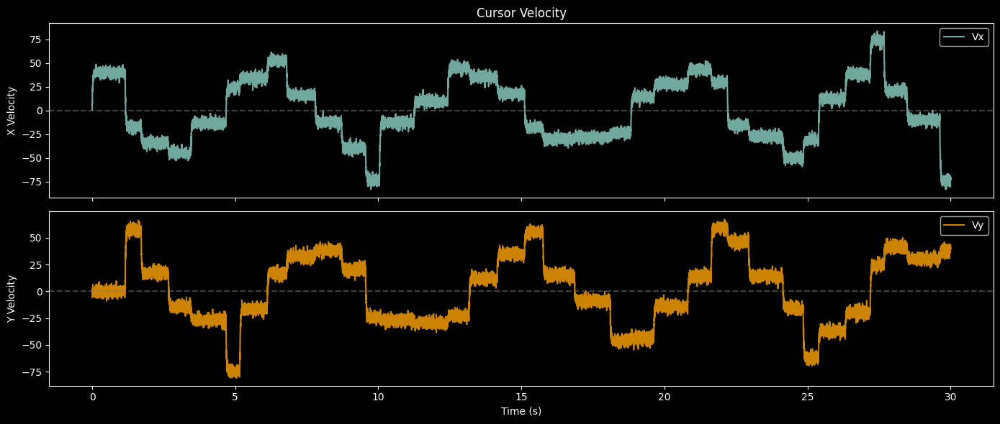

In [84]:
# CURSOR VELOCITY OVER TIME
fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

axes[0].plot(gt["time_s"], gt["vx"], label="Vx", alpha=0.8)
axes[0].set_ylabel("X Velocity")
axes[0].legend()
axes[0].set_title("Cursor Velocity")
axes[0].axhline(0, color="gray", linestyle="--", alpha=0.5)

axes[1].plot(gt["time_s"], gt["vy"], label="Vy", color="orange", alpha=0.8)
axes[1].set_ylabel("Y Velocity")
axes[1].set_xlabel("Time (s)")
axes[1].legend()
axes[1].axhline(0, color="gray", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

# When Vx > 0: cursor moving RIGHT -> Vx+ region should activate
# When Vx < 0: cursor moving LEFT -> Vx- region should activate
# When Vy > 0: cursor moving UP -> Vy+ region should activate
# When Vy < 0: cursor moving DOWN -> Vy- region should activate

## 9. Full Pipeline Class (Ready for Backend)

In [85]:
class SignalFilter:
    """Streaming-compatible signal filter with state."""

    def __init__(
        self,
        fs=500,
        notch_freq=60,
        notch_q=30,
        lowcut=70,
        highcut=150,
        order=4,
        use_notch=True,
    ):
        self.fs = fs
        self.use_notch = use_notch

        # Create notch filter
        if use_notch:
            b, a = iirnotch(notch_freq, notch_q, fs)
            from scipy.signal import tf2sos

            self.notch_sos = tf2sos(b, a)

        # Create bandpass filter
        self.bp_sos = butter(
            order, [lowcut, highcut], btype="band", fs=fs, output="sos"
        )

        # Filter states (initialized on first call)
        self.notch_zi = None
        self.bp_zi = None

    def process(self, chunk):
        """Process a chunk of data, maintaining filter state."""
        from scipy.signal import sosfilt_zi

        n_channels = chunk.shape[1]

        # Initialize states if needed
        if self.use_notch and self.notch_zi is None:
            zi = sosfilt_zi(self.notch_sos)
            self.notch_zi = np.tile(zi[:, :, np.newaxis], (1, 1, n_channels))
        if self.bp_zi is None:
            zi = sosfilt_zi(self.bp_sos)
            self.bp_zi = np.tile(zi[:, :, np.newaxis], (1, 1, n_channels))

        # Apply notch filter (if enabled)
        if self.use_notch:
            notched, self.notch_zi = sosfilt(
                self.notch_sos, chunk, zi=self.notch_zi, axis=0
            )
        else:
            notched = chunk

        # Apply bandpass filter
        filtered, self.bp_zi = sosfilt(self.bp_sos, notched, zi=self.bp_zi, axis=0)

        return filtered


class PowerExtractor:
    """Extract power envelope with temporal smoothing."""

    def __init__(self, alpha=0.15):
        self.alpha = alpha
        self.smoothed = None

    def process(self, filtered):
        """Extract smoothed power from filtered data."""
        # Squared signal (faster than Hilbert)
        power_instant = filtered**2

        # Mean across samples in chunk
        power = np.mean(power_instant, axis=0)

        # EMA smoothing
        if self.smoothed is None:
            self.smoothed = power
        else:
            self.smoothed = self.alpha * power + (1 - self.alpha) * self.smoothed

        return self.smoothed.copy()


class NeuralProcessor:
    """Complete neural processing pipeline with configurable settings."""

    def __init__(self, fs=500, settings=None):
        self.fs = fs
        self.settings = settings or PROCESSING_SETTINGS["hard"]

        self.bad_detector = BadChannelDetector()
        self.signal_filter = SignalFilter(fs=fs, use_notch=self.settings["notch_60hz"])
        self.power_extractor = PowerExtractor(alpha=self.settings["ema_alpha"])

        self.bad_mask = None
        self.init_buffer = []
        self.init_samples_needed = int(1.0 * fs)  # 1 second
        self.do_bad_detection = self.settings["bad_channel_detection"]

    def process_batch(self, neural_data):
        """Process a batch of neural data."""
        chunk = np.array(neural_data)
        if chunk.ndim == 1:
            chunk = chunk.reshape(1, -1)

        # Bad channel detection phase (if enabled)
        if self.bad_mask is None:
            if self.do_bad_detection:
                self.init_buffer.append(chunk)
                total_samples = sum(c.shape[0] for c in self.init_buffer)

                if total_samples >= self.init_samples_needed:
                    all_data = np.vstack(self.init_buffer)
                    self.bad_mask, _ = self.bad_detector.detect(all_data)
                    print(f"Detected {self.bad_mask.sum()} bad channels")
                    self.init_buffer = []
                else:
                    return None
            else:
                # No bad channel detection - just set empty mask
                self.bad_mask = np.zeros(chunk.shape[1], dtype=bool)
                print("Bad channel detection disabled")

        # Filter
        filtered = self.signal_filter.process(chunk)

        # Extract power
        power = self.power_extractor.process(filtered)

        # Format as grid
        grid = to_grid(power, self.bad_mask, sigma=self.settings["spatial_sigma"])

        return grid

In [86]:
# Test the pipeline on our data
processor = NeuralProcessor(fs=500, settings=SETTINGS)
print(f"Using settings for '{DIFFICULTY}':")
for k, v in SETTINGS.items():
    print(f"  {k}: {v}")

# Simulate streaming: process in batches of 10 samples (like real WebSocket)
batch_size = 10
test_grids = []
test_times = []

for i in range(0, len(neural_data), batch_size):
    batch = neural_data[i : i + batch_size]
    if len(batch) < batch_size:
        break

    grid = processor.process_batch(batch)
    if grid is not None:
        test_grids.append(grid)
        test_times.append(time_s[i])

test_grids = np.array(test_grids)
test_times = np.array(test_times)
print(f"\nProcessed {len(test_grids)} frames")

Using settings for 'super_easy':
  notch_60hz: False
  bandpass: True
  bad_channel_detection: False
  spatial_sigma: 0.0
  ema_alpha: 0.3
Bad channel detection disabled

Processed 1500 frames


/var/folders/1s/2z3_qy8136s0zkc3jk82g1jr0000gr/T/ipykernel_9024/2805877328.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


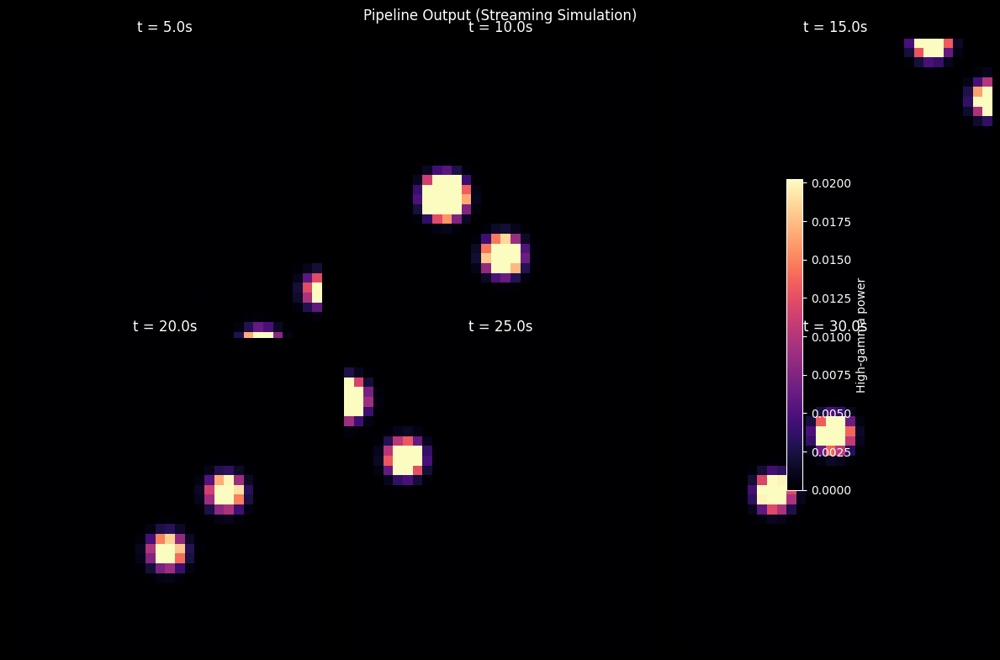

In [87]:
# Compare pipeline output with offline processing
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
vmax = np.percentile(test_grids, 99)

for ax, t in zip(axes.flat, [5, 10, 15, 20, 25, 30]):
    idx = np.argmin(np.abs(test_times - t))
    im = ax.imshow(test_grids[idx], cmap="magma", vmin=0, vmax=vmax)
    ax.set_title(f"t = {test_times[idx]:.1f}s")
    ax.axis("off")

plt.colorbar(im, ax=axes, shrink=0.6, label="High-gamma power")
plt.suptitle("Pipeline Output (Streaming Simulation)")
plt.tight_layout()

/var/folders/1s/2z3_qy8136s0zkc3jk82g1jr0000gr/T/ipykernel_9024/150742105.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


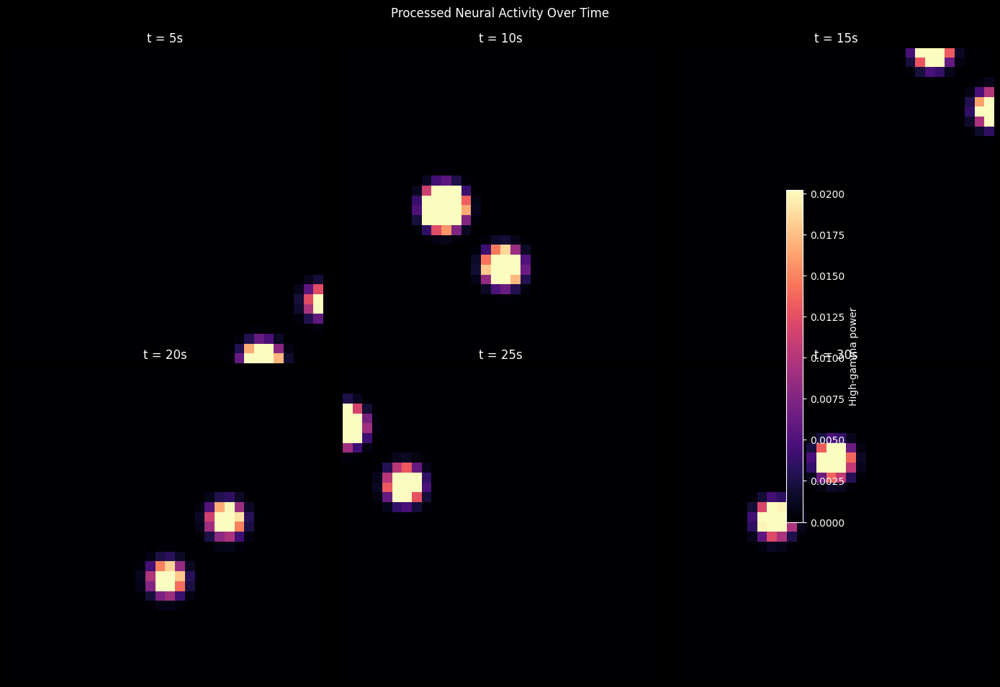

In [88]:
# Visualize pipeline output over time
# Check that required variables exist
if "test_grids" not in dir():
    raise RuntimeError("'test_grids' not computed. Run cell 32 (Pipeline test) first.")

times_validate = [5, 10, 15, 20, 25, 30]

fig, axes = plt.subplots(2, 3, figsize=(14, 10))
vmax = np.percentile(test_grids, 99)

for ax, t in zip(axes.flat, times_validate):
    grid_idx = np.argmin(np.abs(test_times - t))
    im = ax.imshow(
        test_grids[grid_idx], cmap="magma", vmin=0, vmax=vmax, origin="upper"
    )
    ax.set_title(f"t = {t}s")
    ax.axis("off")

plt.colorbar(im, ax=axes, shrink=0.6, label="High-gamma power")
plt.suptitle("Processed Neural Activity Over Time", fontsize=12)
plt.tight_layout()
plt.show()

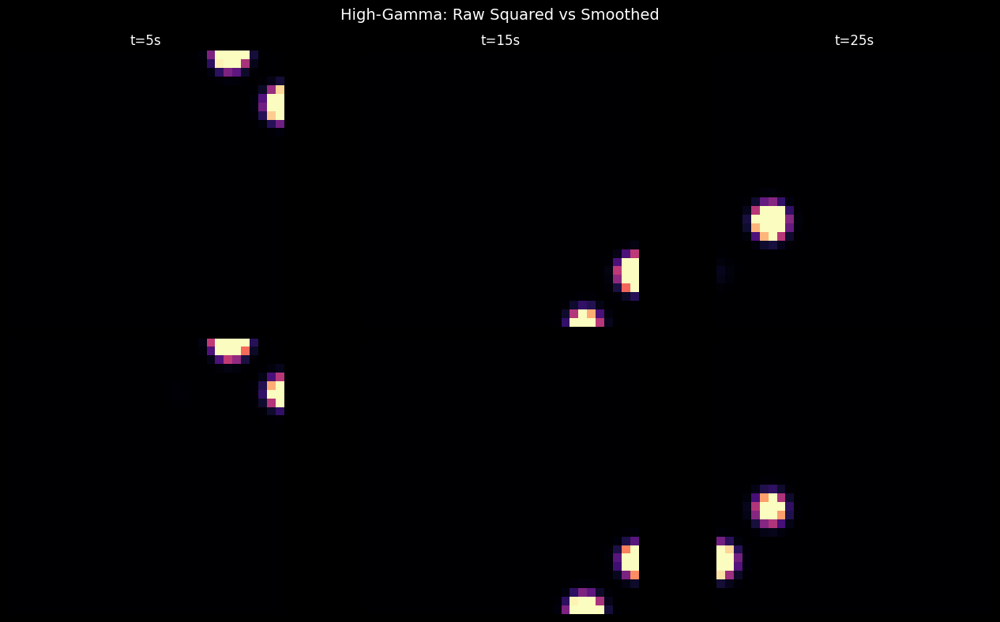

In [89]:
# BEFORE/AFTER: True raw vs smoothed comparison
# Shows instantaneous squared signal vs fully smoothed

times_compare = [5, 15, 25]
fig, axes = plt.subplots(2, 3, figsize=(14, 8))

for col, t in enumerate(times_compare):
    idx = int(t * fs)

    # Row 0: TRUE RAW - just squared bandpass signal, NO smoothing at all
    raw_squared = (filtered[idx] ** 2).reshape(32, 32)
    vmax_raw = np.percentile(raw_squared, 99)
    im0 = axes[0, col].imshow(
        raw_squared, origin="lower", cmap="magma", vmin=0, vmax=vmax_raw
    )
    axes[0, col].set_title(f"t={t}s")
    axes[0, col].axis("off")
    if col == 0:
        axes[0, col].set_ylabel("RAW SQUARED\n(no smoothing)", fontsize=11)

    # Row 1: After all smoothing
    smooth_grid = test_grids[np.argmin(np.abs(test_times - t))]
    vmax_smooth = np.percentile(smooth_grid, 99)
    im1 = axes[1, col].imshow(
        smooth_grid, origin="lower", cmap="magma", vmin=0, vmax=vmax_smooth
    )
    axes[1, col].axis("off")
    if col == 0:
        axes[1, col].set_ylabel("FULLY SMOOTHED", fontsize=11)

plt.suptitle("High-Gamma: Raw Squared vs Smoothed", fontsize=14)
plt.tight_layout()
plt.show()

## Summary

The pipeline is working:
1. Bad channel detection identifies dead/artifact channels
2. 60 Hz notch filter removes line noise
3. 70-150 Hz bandpass extracts high gamma
4. Hilbert envelope gives instantaneous power
5. EMA smoothing reduces flicker
6. Spatial smoothing creates coherent blobs

Ready to port to `backend/processor.py` for real-time WebSocket processing.